# AUPE Processing for Ries Crater Field Trip May 2025

A notebook for developing a processing library and pipeline for AUPE colour and multispectral image processing.

In this notebook we focus on calibrating to the reflectance of the calibration target, handling overexposed patches.

Developed for processing of the Ries Crater field trip, May 2025.

R. Stabbins  
Natural History Museum, London, UK  
7/5/2025

# Overview


**Core Tasks**
1. Load LWAC and/or RWAC MultiSpectral Cube (MSC)
2. Correct for Exposure
3. Visualise with simple Browse Product (NIR-PAN-BLU equivalent)
4. Load corresponding RGB scene
5. Find Calibration Target in RGB scene
6. Get Patch Values from Cal Targ in MSC Frame
7. Fit Patch to Reference Values, export as Reflectance Correction Coeffients (RCC)
8. Apply RCC to exposure corrected MSC to get Reflectance MSC
9. Export MSC to ENVI, FITs, TIFF flt32 (per channel), Browse Product

**Extras**
1. Find LWAC->RWAC Rectification in sRGB images
2. Apply LWAC->RWAC Rectification to MSC, and export as 12 channel cube
3. Find matrix mapping HRC exposure corrected to RWAC exposure corrected, and then to reflectance via RWAC reflectance coefficients
4. Find RWAC->HRC rectification in sRGB images
5. Apply LRWAC full cube -> HRC rectification for mapping spectral channels to HRC.

# Log of Terminal Setup Commands

Copy each of these lines into the terminal and run one at a time.

```conda create -n aupy_dev
conda activate aupy_dev
conda install python matplotlib numpy scipy pillow pandas
conda install conda-forge::opencv

pip install click           
pip install ultralytics         
pip install --user colour-science          
pip install --user colour-checker-detection
pip install roipoly
pip install PyQt5  

```

Ensuring that the terminal is in the 'aupy' working directory, add the aupy library in development mode with:

pip install -e ./src

NOTE - replcae these instructions with a process of 1. buyild new environment from given yml file, 2. activate this environment.

Select ```aupy_dev``` as the kernel to use for running this notebook.

# Notebook and Scene Setup

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'svg' # note - requires Inkscape to be installed, and to be accessible from the terminal
# on macos, add inkscape to the path with `sudo ln -s /Applications/Inkscape.app/Contents/MacOS/inkscape /usr/local/bin/inkscape`
%matplotlib inline

In [2]:
import aupy

We're going to be looking at the AUPE scene that contains the ColorChecker in each of the WACs and HRC.

In [3]:
sol = 'SOL1' # set this manually
scene = 'sol1_0' # set this manually

# LWAC Processing

We start by processing LWAC images.

First we will process the RGB scene to reflectance units, then to sRGB colour.

Then we will load and calibrate the Geology filters to reflectance units.

We will export the sRGB colour scene, a false colour summary product of the Geology filters, and a floating point TIFF and ENVI file of the geology filter multispectral cube.

## LWAC RGB Processing

First we will load the LWAC RGB scene, and calibrate the colour of this using the calibration target in the scene.

In [4]:
lwac_rgb_loader = aupy.AupeIO('LWAC', 'RGB', sol, scene)
lwac_rgb = lwac_rgb_loader.load_frame()

In [5]:
lwac_rgb.exposure_correct()

We make a calibration target object that will allow us to interface with the expected values of the target patches, and provides tools for finding the target in the image.

In [6]:
lwac_cal_targ = aupy.CalibrationTarget()

For precision, we will manually draw around the calibration target. 

First, we drag a rectangular bounding box over the approximate area of the target. Once the area is drawn, press apce-bar to exit the process.

We then zoom into this box, so that we can precisely trace the outline of the target, by left-clicking in turn on each corner of the target. Once the outline is complete, right-click to exit the process.

Draw Bounding Box             |  Draw Outline Quadrilateral
:-------------------------:|:-------------------------:
![caltarg_bounding_box.png](./caltarg_bounding_box.png)  |  ![caltarg_outline.png](./caltarg_outline.png)

Stretching image using 99th percentile balanced
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


2025-06-08 21:11:14.193 python[47687:601247] +[IMKClient subclass]: chose IMKClient_Modern
2025-06-08 21:11:14.193 python[47687:601247] +[IMKInputSession subclass]: chose IMKInputSession_Modern


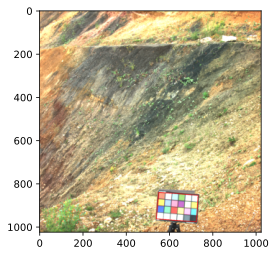

True

In [7]:
lwac_cal_targ.draw_target_outline(lwac_rgb.get_image('99b'), show=True)

We need a method for getting bad bands out of the image. We should just apply this to the pre-exposure corrected image set.

In [8]:
lwac_cal_targ.get_bad_patches(lwac_rgb)

Target Width: 181 Height: 123, Samples: 225
Bad patches: ['light skin', 'blue sky', 'blue flower', 'bluish green', 'orange', 'purplish blue', 'moderate red', 'yellow green', 'orange yellow', 'blue', 'green', 'red', 'yellow', 'magenta', 'cyan', 'white 9.5 (.05 D)', 'neutral 8 (.23 D)', 'neutral 6.5 (.44 D)', 'neutral 5 (.70 D)']


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


Stretching image using brightest pixel unbalanced
Target Width: 181 Height: 123, Samples: 225


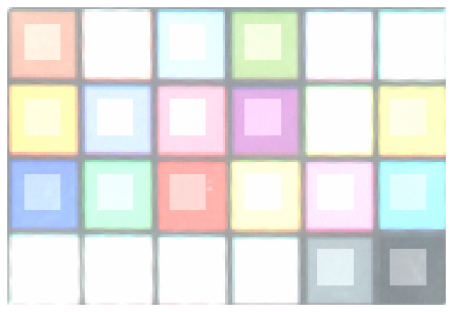

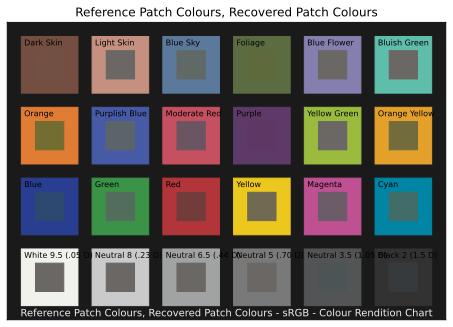

array([[ 0.19164904,  0.00740415, -0.05079317],
       [-0.03125915,  0.20068558, -0.0328983 ],
       [-0.01395602, -0.05361232,  0.19871802]])

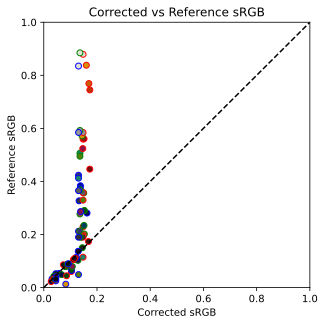

In [9]:
lwac_cal_targ.calibrate_colour(lwac_rgb, show=True)

The method produces some figures to show the success of the colour correction process.

First we see the masks used to sample the patches of the calibration target. The sample size is chosen based on the number of pixels of the target.

Then, we see a comparison between the target colour of each patch (outer box) versus the fitted colour (inner box).

In this instance, we see that mid-brightness patches are typically perceptibly close, whereas dark and bright patches have a noticeable difference.

The fit is shown quantitatively in the final plot. We can see that dark patches typically lie above the line of concordance, with brighter patches lying below.

This implies some nonlinearity in the AUPE response, that should be corrected at some stage.

We can see the results of the colour calibration by applying the colour correction matrix to our image.

Stretching image using brightest pixel unbalanced


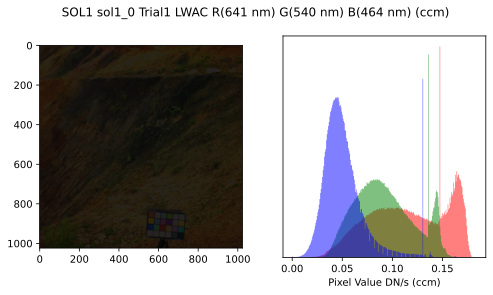

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value DN/s (ccm)'>], dtype=object))

In [10]:
lwac_rgb.show_image('ccm')

We can also export the colour corrected image.

In [11]:
lwac_rgb.export_image('ccm')

Exporting image using colour correction matrix
Stretching image using brightest pixel unbalanced
CCM saved to ../data/../processed/SOL1/sol1_0/Trial1/LWAC/RGB/SOL1_sol1_0_Trial1_LWAC_ccm.csv


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/LWAC/RGB/SOL1_sol1_0_Trial1_LWAC_RGB_L1RL2GL3B_ccm.png')

We note that this colour correction isn't perfect, because it assumes that the scene illumination matches the illumination used for the Colour Checker patch expected values.

One way to correct for this would be to fit an illuminant parameterised by correlated colour temperature.

Alternatively, we can solve for the illuminant via the reflectance calibration stage.

## LWAC RGB Reflectance Calibration

Here we will load the RGB image of the LWAC as a multispectral cube, that we will calibrate the reflectance of.

We can then find the transform from the reflectance to the XYZ Colour Space, independent of illumination, from which we can convert to sRGB.

In [129]:
lwac_rgb_msc_loader = aupy.AupeIO('LWAC', 'MSC', sol, scene, filter_ids=['L1R', 'L2G', 'L3B'])
lwac_rgb_msc = lwac_rgb_msc_loader.load_frame()

In [130]:
lwac_rgb_msc.exposure_correct()

In [131]:
lwac_cal_targ = aupy.CalibrationTarget()

In [134]:
lwac_rgb_msc.set_false_color({'R': 'L1R', 'G': 'L2G', 'B': 'L3B'})

Stretching image using 99th percentile balanced
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


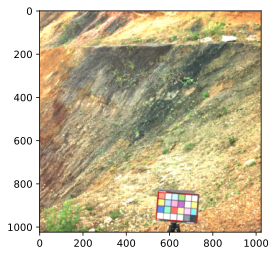

True

In [135]:
lwac_cal_targ.draw_target_outline(lwac_rgb_msc.false_rgb.get_image('99b'), show=True)

In [136]:
lwac_cal_targ.bad_patches = {}

In [145]:
lwac_cal_targ.get_bad_patches(lwac_rgb_msc)

Target Width: 181 Height: 123, Samples: 225
Bad patch light skin in band L1R
Bad patch blue flower in band L1R
Bad patch bluish green in band L1R
Bad patch orange in band L1R
Bad patch moderate red in band L1R
Bad patch yellow green in band L1R
Bad patch orange yellow in band L1R
Bad patch red in band L1R
Bad patch yellow in band L1R
Bad patch magenta in band L1R
Bad patch white 9.5 (.05 D) in band L1R
Bad patch neutral 8 (.23 D) in band L1R
Bad patch neutral 6.5 (.44 D) in band L1R
Bad patch neutral 5 (.70 D) in band L1R
Bad patch light skin in band L2G
Bad patch blue sky in band L2G
Bad patch blue flower in band L2G
Bad patch bluish green in band L2G
Bad patch orange in band L2G
Bad patch yellow green in band L2G
Bad patch orange yellow in band L2G
Bad patch green in band L2G
Bad patch yellow in band L2G
Bad patch cyan in band L2G
Bad patch white 9.5 (.05 D) in band L2G
Bad patch neutral 8 (.23 D) in band L2G
Bad patch neutral 6.5 (.44 D) in band L2G
Bad patch neutral 5 (.70 D) in ba

/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/exten

We can use the previous calibration target here.

Target Width: 181 Height: 123, Samples: 225
L1R 641 nm: coeff=1.77e-051/DN/s, offset=-0.0187
L2G 540 nm: coeff=1.52e-051/DN/s, offset=-0.0199
L3B 464 nm: coeff=1.58e-051/DN/s, offset=-0.0259


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:1123: OptimizeWarning: Covariance of the parameters could not be estimated
  params, *_ = curve_fit(gauss,


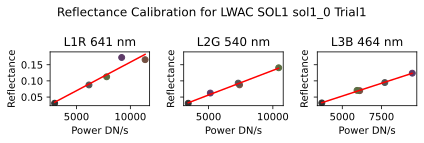

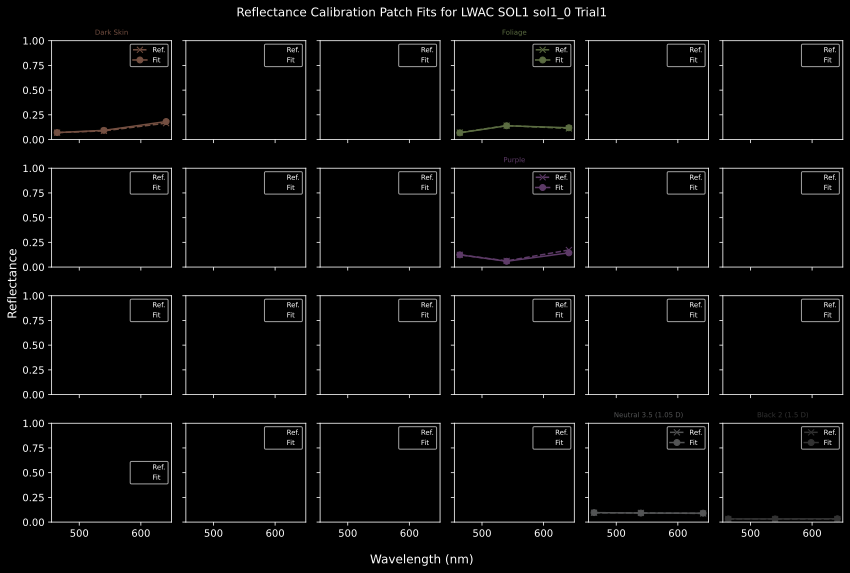

In [14]:
lwac_cal_targ.calibrate_reflectance(lwac_rgb_msc,show=True)

We can see that the generally good fits have been found for each of the Red, Green and Blue channels. The reflectance of the White patch of the target has been slightly underestimated by the fit, implying that there is either some nonlinearity for brighter values, or that the target white patch is not as bright as it once was.

We now need to perform a special colour calibration, when we produce a false colour image of the MSC, that we then convert to units of XYZ, and then apply sRGB calibration to give the true colour of the scene.

First we apply the reflectance calibration, to convert the image to reflectance units.

In [15]:
lwac_rgb_msc.apply_reflectance_calibration()

We then need to set up the 3-band Multispectral Cube (MSC) as a false colour RGB image, so that we can access the colour calibration tools.

In [16]:
lwac_rgb_msc.set_false_color({'R':'L1R', 'G':'L2G', 'B':'L3B'})

Before colour calibration, we can show the reflectance balanced rgb image:

/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/IPython/exten

Stretching image using brightest pixel unbalanced


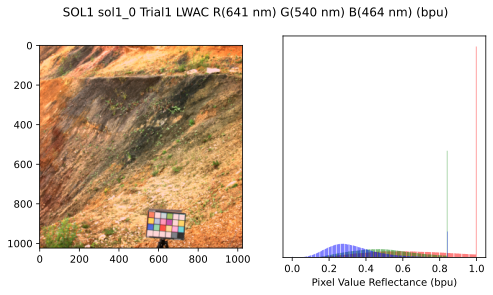

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (bpu)'>], dtype=object))

In [105]:
lwac_rgb_msc.false_rgb.show_image('bpu')

This doesn't account for the illumination spectral power distribution, or for the interactions of the different device RGB channels when forming the standard-RGB image.

We find this by performing colour calibration on this reflectance image.

Target Width: 181 Height: 123, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


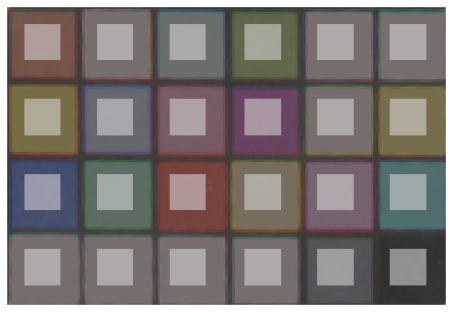

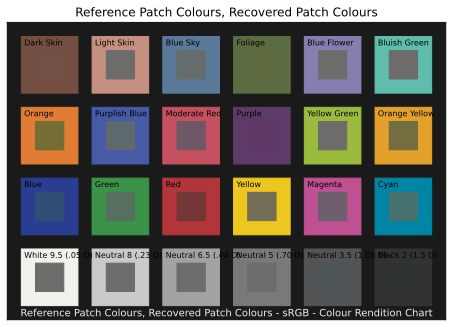

array([[ 0.95498237,  0.09550495, -0.20707074],
       [-0.16153786,  1.23200479, -0.06971931],
       [-0.07598842, -0.20769997,  1.25978955]])

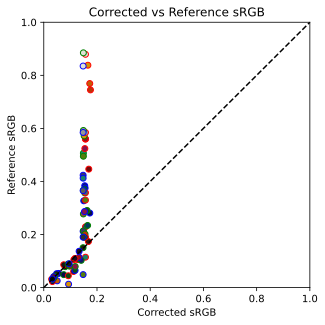

In [18]:
lwac_cal_targ.calibrate_colour(lwac_rgb_msc.false_rgb, show=True)

We can see that this method gives slightly better performance in matching the colours, with the exception of some of the white/neutral/black patches.

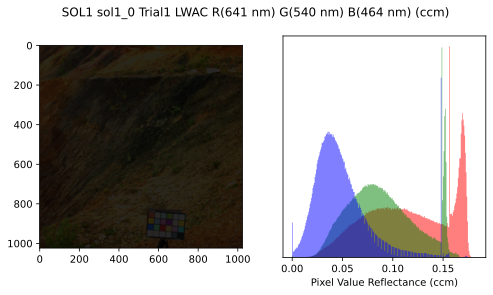

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (ccm)'>], dtype=object))

In [19]:
lwac_rgb_msc.false_rgb.show_image('ccm')

In [20]:
lwac_rgb_msc.false_rgb.export_image('ccm')

Exporting image using colour correction matrix
CCM saved to ../data/../processed/SOL1/sol1_0/Trial1/LWAC/MSC/RGB/SOL1_sol1_0_Trial1_LWAC_ccm.csv


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/LWAC/MSC/RGB/SOL1_sol1_0_Trial1_LWAC_RGB_L1RL2GL3B_ccm.png')

Target Width: 181 Height: 123, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


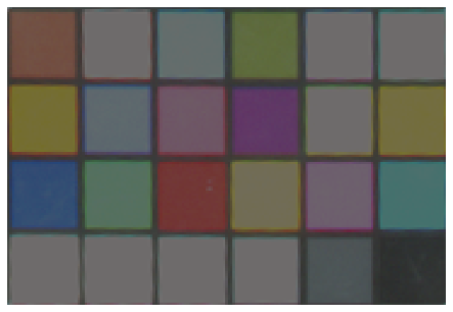

In [21]:
lwac_cal_targ.show_target(lwac_rgb_msc.false_rgb.get_image('ccm'))

Reference Colour Checker   |
:-------------------------:|
![Gretag-Macbeth_ColorChecker.jpg](./Gretag-Macbeth_ColorChecker.jpg) 

In contrast to the RGB corrected method:

Stretching image using brightest pixel unbalanced
Target Width: 181 Height: 123, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


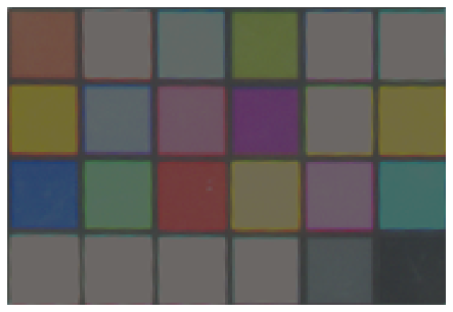

In [22]:
lwac_cal_targ.show_target(lwac_rgb.get_image('ccm'))

We consider this method to be the most accurate for colour recovery.

## LWAC MSC Narrowband Reflectance Calibration

Now we will use the calibration target object and apply it to the narrowband filters of the LWAC, to calibrate to reflectance.

In [23]:
lwac_msc_loader = aupy.AupeIO('LWAC', 'MSC', sol, scene)
lwac_msc = lwac_msc_loader.load_frame()

Check the exposure values, and perform exposure correction.

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'center': 'SOL1 sol1_0 Trial1 LWAC'}, xlabel='Wavelength (nm)', ylabel='Exposure Time (s)'>)

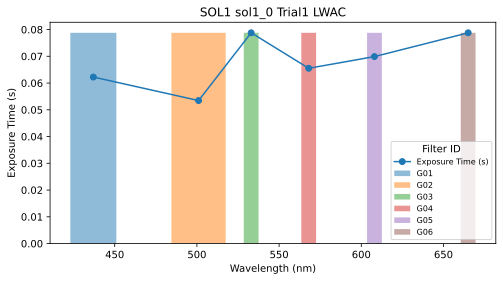

In [24]:
lwac_msc.exposure_correct()
lwac_msc.plot_exposures()

Set up a subset of the frame to make an RGB image.

In [25]:
false_colour_bands = {
    'R': 'G06',
    'G': 'G03',
    'B': 'G01'
}
lwac_msc.set_false_color(false_colour_bands)

Show the false colour image.

Stretching image using 99th percentile unbalanced


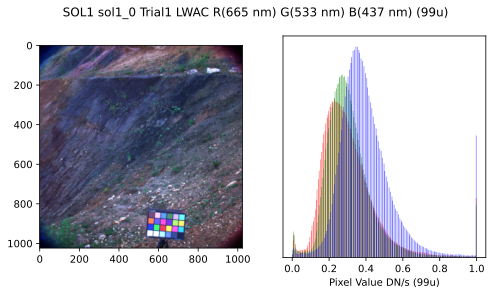

In [26]:
fig, ax = lwac_msc.false_rgb.show_image('99u')

Setup a calibration target, and draw the target in the false colour image.

Let's check that the calibration target drawing is working as expected:

Stretching image using 99th percentile balanced


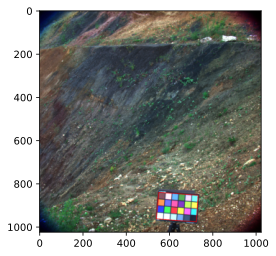

(<Figure size 400x400 with 1 Axes>, <Axes: >)

In [27]:
lwac_cal_targ.show_target_outline(lwac_msc.false_rgb.get_image('99b'))

Stretching image using 99th percentile balanced
Target Width: 181 Height: 123, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


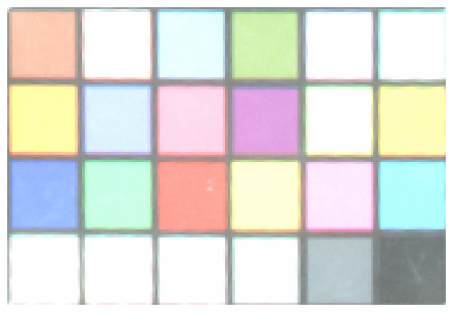

In [28]:
lwac_cal_targ.show_target(lwac_rgb_msc.false_rgb.get_image('99b'))

We can see that the outline and mapping drawn on the broadband channels translates to the narrowband channels without issue.

We now ca perform reflectance calibration on the MSC.

Target Width: 181 Height: 123, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:1123: OptimizeWarning: Covariance of the parameters could not be estimated
  params, *_ = curve_fit(gauss,
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/scipy/optimize/_minpack_py.py:497: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


G01 437 nm: coeff=8.22e-051/DN/s, offset=-0.0199
G02 501 nm: coeff=4.24e-051/DN/s, offset=-0.0232
G03 533 nm: coeff=0.0001491/DN/s, offset=-0.013
G04 568 nm: coeff=0.0001551/DN/s, offset=-0.0158
G05 608 nm: coeff=0.0001671/DN/s, offset=-0.0164
G06 665 nm: coeff=0.0002171/DN/s, offset=-0.0227


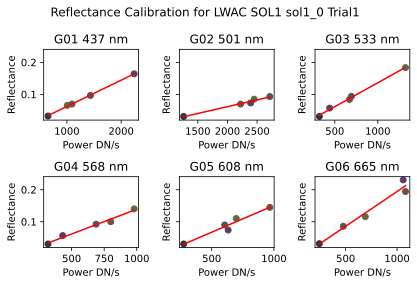

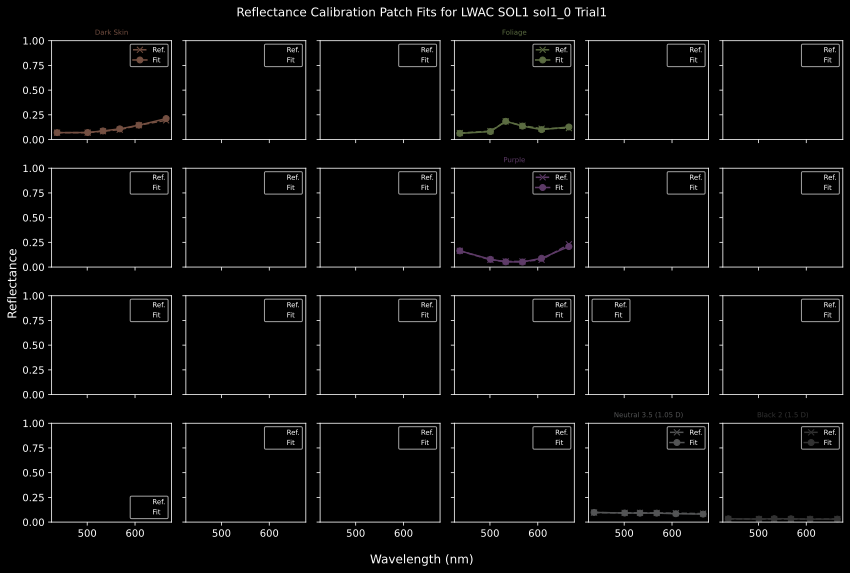

In [29]:
lwac_cal_targ.calibrate_reflectance(lwac_msc, show=True)

We can see that the algorithm has found mostly good linear fits between the exposure corrected pixel values and the reference reflectance for each channel.

We now apply that reflectance calibration to the scene.

In [30]:
lwac_msc.apply_reflectance_calibration()

We can look at the false colour image of the approximate R, G and B narrowbands.

Show the false colour image, after reflectance calibration.

Stretching image using 99th percentile unbalanced


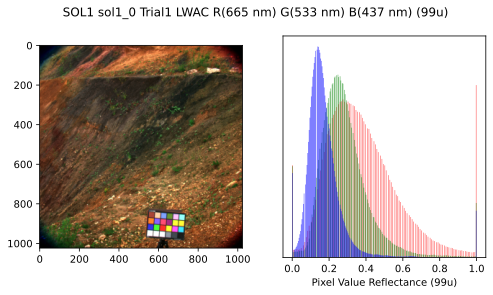

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (99u)'>], dtype=object))

In [31]:
lwac_msc.false_rgb.show_image('99u')

We can make a recording of this browse product.

In [32]:
lwac_msc.false_rgb.export_image('99u')

Exporting image using 99th percentile unbalanced
Stretching image using 99th percentile unbalanced


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/LWAC/MSC/RGB/SOL1_sol1_0_Trial1_LWAC_RGB_G06G03G01_99u.png')

We now export this multispectral cube to ENVI for analysis.

In [33]:
lwac_msc.export_2_envi()

Reflectance coefficients saved to ../data/../processed/SOL1/sol1_0/Trial1/LWAC/MSC/SOL1_sol1_0_Trial1_LWAC_refl_coeffs.csv


We also produce a GIF animation for browsing the bands.

In [34]:
lwac_msc.export_2_gif()

Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 1.0


---

# RWAC Processing

We now perform the same set of steps on the RWAC.

Again, first we will process the RGB scene to reflectance units, then to sRGB colour.

Then we will load and calibrate the Geology filters to reflectance units.

We will export the sRGB colour scene, a false colour summary product of the Geology filters, and a floating point ENVI file of the geology filter multispectral cube.

## RWAC RGB Processing

First we will load the RWAC RGB scene, and calibrate the colour of this using the calibration target in the scene.

In [35]:
rwac_rgb_loader = aupy.AupeIO('RWAC', 'RGB', sol, scene)
rwac_rgb = rwac_rgb_loader.load_frame()

In [36]:
rwac_rgb.exposure_correct()

We make a calibration target object that will allow us to interface with the expected values of the target patches, and provides tools for finding the target in the image.

In [37]:
rwac_cal_targ = aupy.CalibrationTarget()

Because we have a new view (the RWAC), we need to draw this calibration target again.

Stretching image using 99th percentile balanced
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


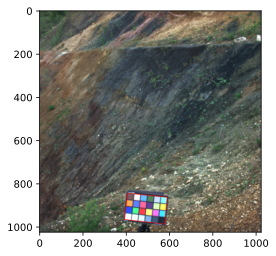

True

In [38]:
rwac_cal_targ.draw_target_outline(rwac_rgb.get_image('99b'), show=True)

Stretching image using brightest pixel unbalanced
Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


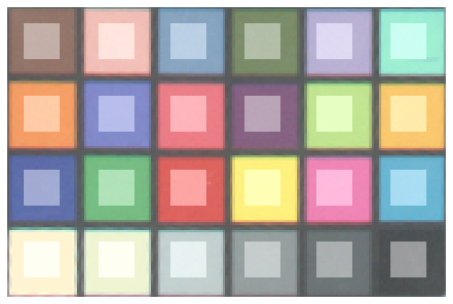

/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:68: RuntimeWarning: invalid value encountered in power
  return (x ** gamma)
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:876: OptimizeWarning: Covariance of the parameters could not be estimated
  fit, covar = curve_fit(gamma_curve,


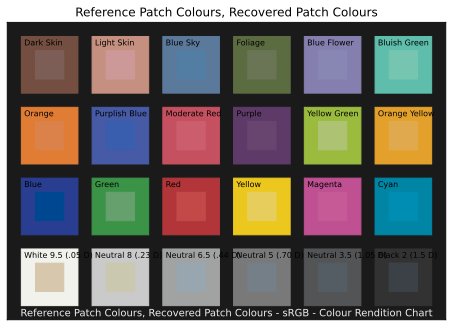

array([[ 0.76236038,  0.10832191, -0.27653324],
       [-0.01931674,  0.74914307, -0.13459043],
       [-0.02257057, -0.03272754,  0.72992898]])

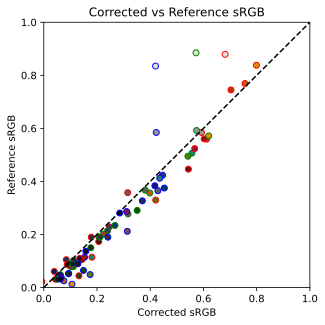

In [39]:
rwac_cal_targ.calibrate_colour(rwac_rgb, show=True)

As for the LWAC, we achieve good colour matching with the RWAC RGB channels.

We can see the results of the colour calibration by applying the colour correction matrix to our image.

Stretching image using brightest pixel unbalanced


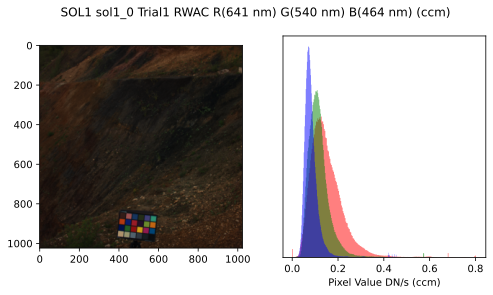

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value DN/s (ccm)'>], dtype=object))

In [40]:
rwac_rgb.show_image('ccm')

We can also export the colour corrected image.

In [41]:
rwac_rgb.export_image('ccm')

Exporting image using colour correction matrix
Stretching image using brightest pixel unbalanced
CCM saved to ../data/../processed/SOL1/sol1_0/Trial1/RWAC/RGB/SOL1_sol1_0_Trial1_RWAC_ccm.csv


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/RWAC/RGB/SOL1_sol1_0_Trial1_RWAC_RGB_R1RR2GR3B_ccm.png')

We note that this colour correction isn't perfect, because it assumes that the scene illumination matches the illumination used for the Colour Checker patch expected values.

One way to correct for this would be to fit an illuminant parameterised by correlated colour temperature.

Alternatively, we can solve for the illuminant via the reflectance calibration stage.

## RWAC RGB Reflectance Calibration

Here we will load the RGB image of the RWAC as a multispectral cube, that we will calibrate the reflectance of.

We can then find the transform from the reflectance to the XYZ Colour Space, independent of illumination, from which we can convert to sRGB.

In [42]:
rwac_rgb_msc_loader = aupy.AupeIO('RWAC', 'MSC', sol, scene, filter_ids=['R1R', 'R2G', 'R3B'])
rwac_rgb_msc = rwac_rgb_msc_loader.load_frame()

In [43]:
rwac_rgb_msc.exposure_correct()

We can use the previous calibration target here.

Target Width: 183 Height: 121, Samples: 225
R1R 641 nm: coeff=2.14e-051/DN/s, offset=-0.037
R2G 540 nm: coeff=2.15e-051/DN/s, offset=-0.0552
R3B 464 nm: coeff=2.36e-051/DN/s, offset=-0.0583


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:1123: OptimizeWarning: Covariance of the parameters could not be estimated
  params, *_ = curve_fit(gauss,


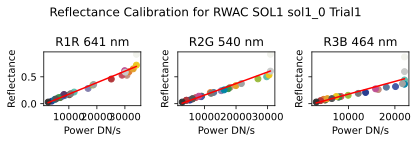

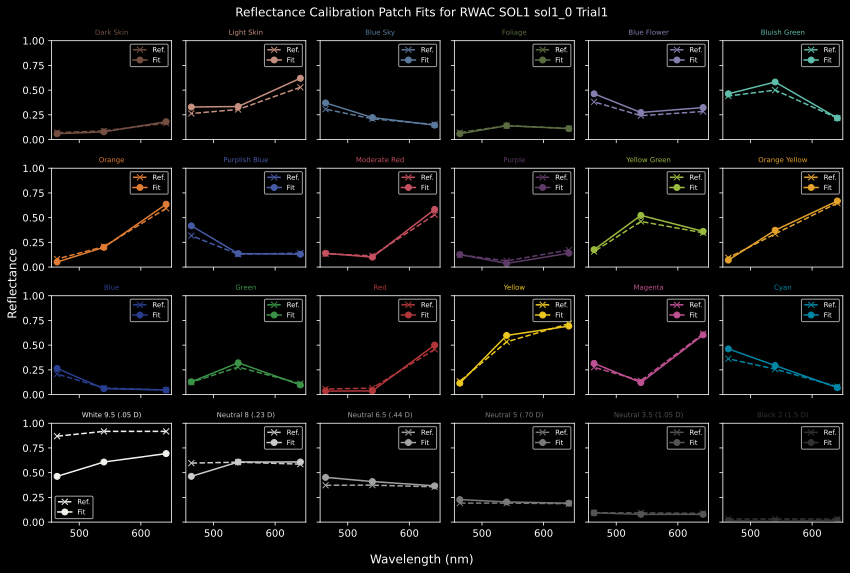

In [44]:
rwac_cal_targ.calibrate_reflectance(rwac_rgb_msc,show=True)

As for the LWAC, we can see that the generally good fits have been found for each of the Red, Green and Blue channels. The reflectance of the White patch of the target has been slightly underestimated by the fit, implying that there is either some nonlinearity for brighter values, or that the target white patch is not as bright as it once was.

We now need to perform a special colour calibration, when we produce a false colour image of the MSC, that we then convert to units of XYZ, and then apply sRGB calibration to give the true colour of the scene.

First we apply the reflectance calibration, to convert the image to reflectance units.

In [45]:
rwac_rgb_msc.apply_reflectance_calibration()

We then need to set up the 3-band Multispectral Cube (MSC) as a false colour RGB image, so that we can access the colour calibration tools.

In [46]:
rwac_rgb_msc.set_false_color({'R':'R1R', 'G':'R2G', 'B':'R3B'})

Before colour calibration, we can show the reflectance balanced rgb image:

Stretching image using 99th percentile unbalanced


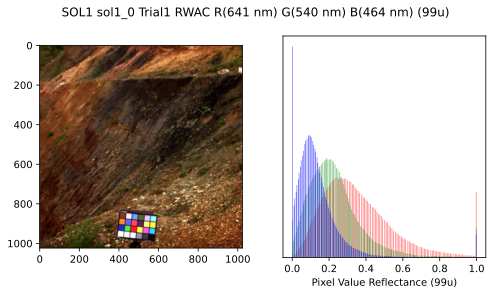

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (99u)'>], dtype=object))

In [47]:
rwac_rgb_msc.false_rgb.show_image('99u')

This doesn't account for the illumination spectral power distribution, or for the interactions of the different device RGB channels when forming the standard-RGB image.

We find this by performing colour calibration on this reflectance image.

Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


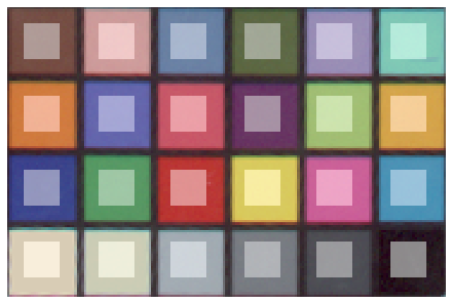

/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:68: RuntimeWarning: invalid value encountered in power
  return (x ** gamma)
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:876: OptimizeWarning: Covariance of the parameters could not be estimated
  fit, covar = curve_fit(gamma_curve,


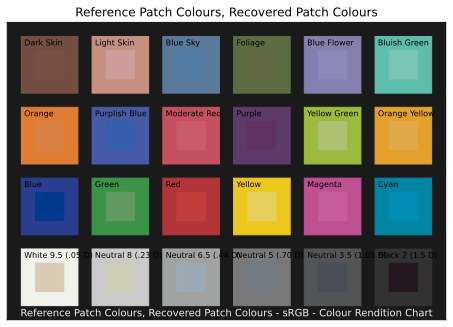

array([[ 1.07077883,  0.15275365, -0.29147273],
       [ 0.02024954,  1.03025309, -0.08079525],
       [ 0.01691045, -0.03481745,  1.00341407]])

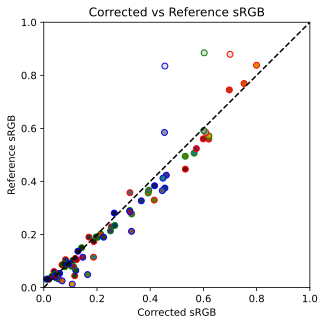

In [48]:
rwac_cal_targ.calibrate_colour(rwac_rgb_msc.false_rgb, show=True)

We can see that this method gives slightly better performance in matching the colours, with the exception of some of the white/neutral/black patches.

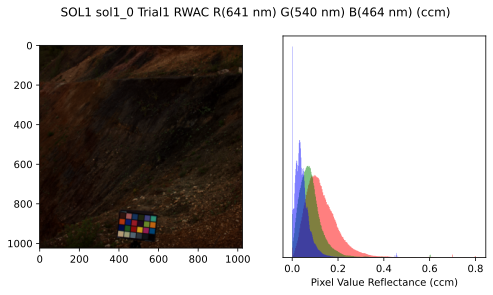

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (ccm)'>], dtype=object))

In [49]:
rwac_rgb_msc.false_rgb.show_image('ccm')

In [50]:
rwac_rgb_msc.false_rgb.export_image('ccm')

Exporting image using colour correction matrix
CCM saved to ../data/../processed/SOL1/sol1_0/Trial1/RWAC/MSC/RGB/SOL1_sol1_0_Trial1_RWAC_ccm.csv


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/RWAC/MSC/RGB/SOL1_sol1_0_Trial1_RWAC_RGB_R1RR2GR3B_ccm.png')

Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


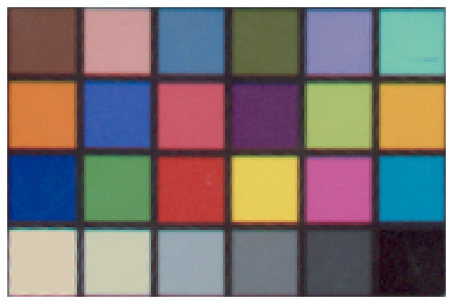

In [51]:
rwac_cal_targ.show_target(rwac_rgb_msc.false_rgb.get_image('ccm'))

Reference Colour Checker   |
:-------------------------:|
![Gretag-Macbeth_ColorChecker.jpg](./Gretag-Macbeth_ColorChecker.jpg) 

In contrast to the RGB corrected method:

Stretching image using brightest pixel unbalanced
Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


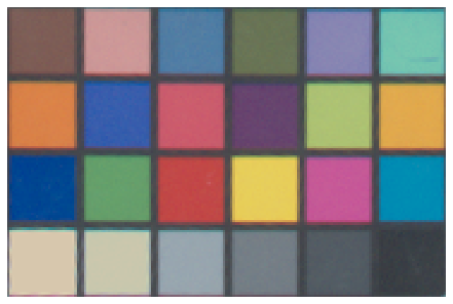

In [52]:
rwac_cal_targ.show_target(rwac_rgb.get_image('ccm'))

We consider this method to be the most accurate for colour recovery.

## RWAC MSC Narrowband Reflectance Calibration

Now we will use the calibration target object and apply it to the narrowband filters of the RWAC, to calibrate to reflectance.

In [53]:
rwac_msc_loader = aupy.AupeIO('RWAC', 'MSC', sol, scene)
rwac_msc = rwac_msc_loader.load_frame()

Check the exposure values, and perform exposure correction.

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'center': 'SOL1 sol1_0 Trial1 RWAC'}, xlabel='Wavelength (nm)', ylabel='Exposure Time (s)'>)

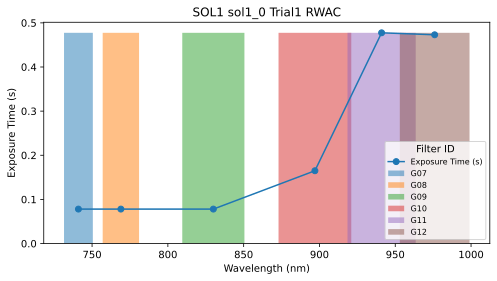

In [54]:
rwac_msc.exposure_correct()
rwac_msc.plot_exposures()

Set up a subset of the frame to make an RGB image.

In [55]:
false_colour_bands = {
    'R': 'G12',
    'G': 'G09',
    'B': 'G07'
}
rwac_msc.set_false_color(false_colour_bands)

Show the false colour image.

Stretching image using 99th percentile balanced


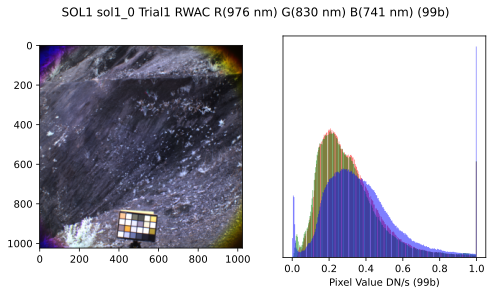

In [56]:
fig, ax = rwac_msc.false_rgb.show_image('99b')

Let's check that the calibration target drawing is working as expected:

Stretching image using 99th percentile balanced


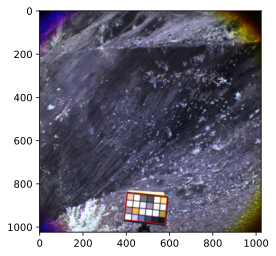

(<Figure size 400x400 with 1 Axes>, <Axes: >)

In [57]:
rwac_cal_targ.show_target_outline(rwac_msc.false_rgb.get_image('99b'))

Stretching image using 99th percentile balanced
Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


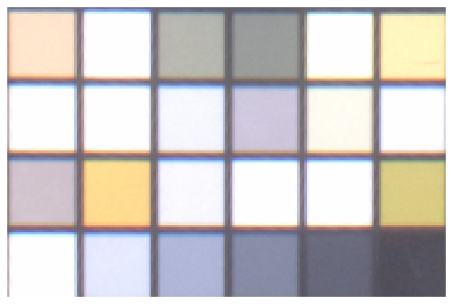

In [58]:
rwac_cal_targ.show_target(rwac_msc.false_rgb.get_image('99b'))

We can see that the outline and mapping drawn on the broadband channels translates to the narrowband channels without issue.

We now can perform reflectance calibration on the MSC.

We have found that several of the reference spectra for the calibration target fit the data poorly. That is, the patch reference values fall far from the linear fit of the observed patches.

This data should be collected again, but in the mean time, we have developed a method for defining 'bad patches' to neglect during fitting.

In [59]:
# get bad patches, and set to NaN
bad_patches = [ #'dark skin',
                'light skin',
                'blue sky',
                #'foliage',
                #'blue flower',
                'bluish green',
                # 'orange',
                'purplish blue',
                # 'moderate red',
                'purple',
                # 'yellow green',
                # 'orange yellow',
                'blue',
                'green',
                # 'red',
                # 'yellow',
                # 'magenta',
                'cyan',
                # 'white 9.5 (.05 D)',
                # 'neutral 8 (.23 D)',
                # 'neutral 6.5 (.44 D)',
                # 'neutral 5 (.70 D)',
                # 'neutral 3.5 (1.05 D)',
                #'black 2 (1.5 D)'
                ]

In [60]:
rwac_cal_targ.bad_patches = bad_patches

Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028
/Users/sci/Documents/projects/uksapdra_2024-2025/fieldtrips/ries_crater_may_2025/aupy/aupy.py:1123: OptimizeWarning: Covariance of the parameters could not be estimated
  params, *_ = curve_fit(gauss,
/opt/homebrew/Caskroom/miniconda/base/envs/aupy_dev/lib/python3.13/site-packages/scipy/optimize/_minpack_py.py:497: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


G07 741 nm: coeff=0.0002381/DN/s, offset=-0.123
G08 769 nm: coeff=0.0002361/DN/s, offset=-0.117
G09 830 nm: coeff=0.000261/DN/s, offset=-0.0665
G10 897 nm: coeff=0.0005571/DN/s, offset=-0.0762
G11 941 nm: coeff=0.001571/DN/s, offset=-0.085
G12 976 nm: coeff=0.001521/DN/s, offset=-0.0483


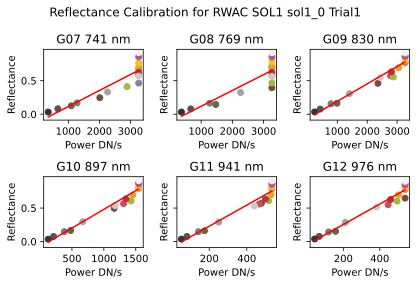

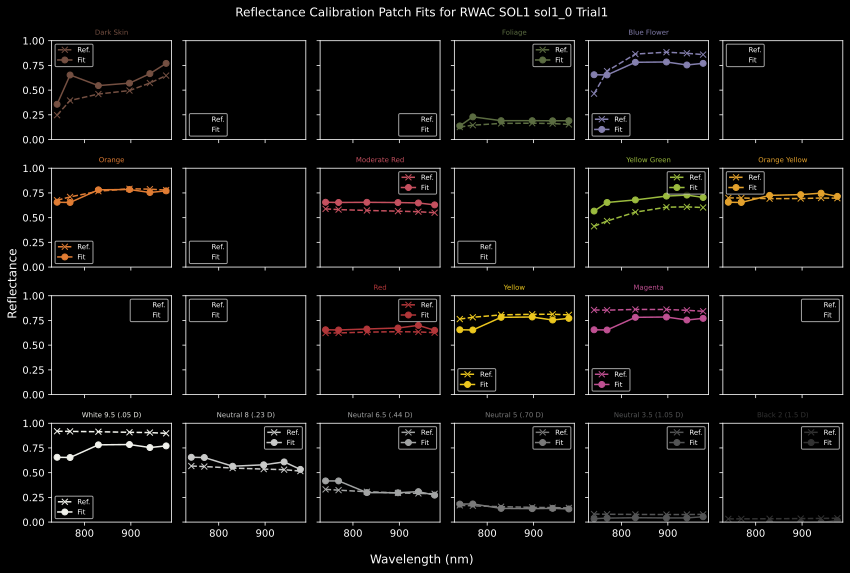

In [61]:
rwac_cal_targ.calibrate_reflectance(rwac_msc, show=True)

Here, for the RWAC, we find that several of the patches have poor linear fits to the infrared bands. We attribute this to outdated spectral reflectance measurements on the patches. This data should be updated, by performing high resolution spectral reflectance measurements on this instance of the calibration target.

For now, the data is sufficient to show that the pipeline is operational.

We now apply that reflectance calibration to the scene.

In [62]:
rwac_msc.apply_reflectance_calibration()

We can look at the false colour image.

Show the false colour image, after reflectance calibration.

Stretching image using 99th percentile balanced


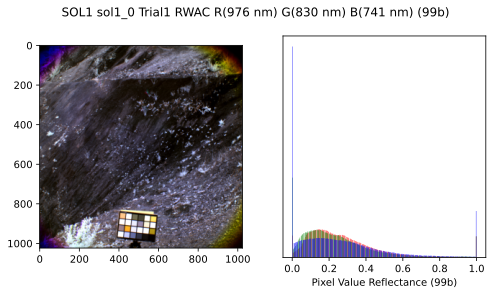

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (99b)'>], dtype=object))

In [63]:
rwac_msc.false_rgb.show_image('99b')

We can make a recording of this browse product.

In [64]:
rwac_msc.false_rgb.export_image('99b')

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/RWAC/MSC/RGB/SOL1_sol1_0_Trial1_RWAC_RGB_G12G09G07_99b.png')

We now export this multispectral cube to ENVI for analysis.

In [65]:
rwac_msc.export_2_envi()

Reflectance coefficients saved to ../data/../processed/SOL1/sol1_0/Trial1/RWAC/MSC/SOL1_sol1_0_Trial1_RWAC_refl_coeffs.csv


We also produce a GIF animation for browsing the bands.

In [66]:
rwac_msc.export_2_gif()

Exporting image G07 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G08 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G09 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G10 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G11 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G12 
Stretching image using raw image no stretch
Applying stretch factor of 1.0


---

# LWAC -> RWAC Rectification

Now that we have the LWAC and RWAC images processed in RGB and as MSCs (Multispectral Cubes), we can find the mapping from the LWAC RGB frame to the RWAC RGB frame, and then apply this to the LWAC MSC, to give a complete RWAC 12 channel MSC.

In [67]:
st = aupy.StereoTools(lwac_rgb_msc.false_rgb.get_image('99b'), rwac_rgb_msc.false_rgb.get_image('99b'))

Stretching image using 99th percentile balanced
Stretching image using 99th percentile balanced


Select a region in each image to find the warping for.

In [68]:
st.select_match_regions()

Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


In this example, we have specified the warping to optimised for the calibration target. This means that we can verify the reflectance calibration in ENVI by checking the reflectance of the patches in comparison to the expected values.

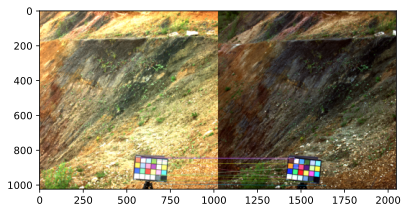

Found 12 good matches between source and destination regions.


In [69]:
st.findWarp(show=True)

We now give this choice of target to optimise the rectification for a tag.

In [70]:
tag = 'caltarg'

Even selecting a small subset of the image has successfully found 40 tie-points to use when solving for the homography matrix, that wars the LWAC view to the RWAC.

We're going to prepare an all-filter MSC as the destination.

In [71]:
lrwac_msc_loader = aupy.AupeIO('LRWAC', 'MSC', sol, scene)
lrwac_msc = lrwac_msc_loader.load_frame()

Now we will apply the warp that we learned above to the full MSCs for the LWAC, warping it to the RWAC.

In [72]:
st.applyWarp(lwac_msc, rwac_msc, lrwac_msc, tag)

To illustrate this, we will produce a NIR, Red, Blue browse product image, using the G11, G05 and G01 narrowband filters.

In [73]:
lrwac_msc.set_false_color({'R': 'G11', 'G': 'G05', 'B': 'G01'})

Stretching image using 99th percentile balanced


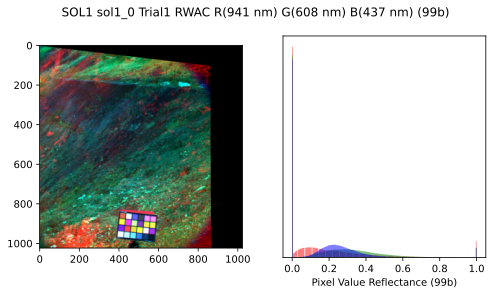

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (99b)'>], dtype=object))

In [74]:
lrwac_msc.false_rgb.show_image('99b')

We can check that the calibration target has been correctly warped by looking at the rwac_cal_targ object with this image underneath.

Stretching image using 99th percentile balanced
Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


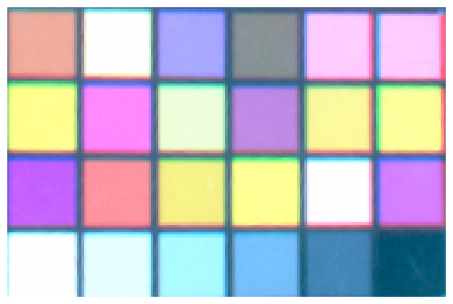

In [75]:
rwac_cal_targ.show_target(lrwac_msc.false_rgb.get_image('99b'))

We can see that the patches are well resolved.

We now export this browse product, along with an ENVI file of the complete scene, and a gif animation of the bands.

In [76]:
lrwac_msc.false_rgb.export_image('99b')

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/LRWAC/MSC/caltarg/RGB/SOL1_sol1_0_Trial1_RWAC_RGB_G11G05G01_99b.png')

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'center': 'SOL1 sol1_0 Trial1 LRWAC'}, xlabel='Wavelength (nm)', ylabel='Response Function'>)

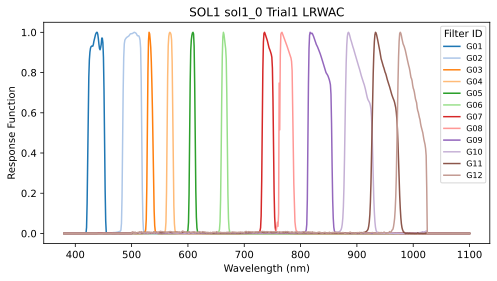

In [77]:
lrwac_msc.plot_filter_responses()

In [78]:
lrwac_msc.export_2_envi()

Reflectance coefficients saved to ../data/../processed/SOL1/sol1_0/Trial1/LRWAC/MSC/caltarg/SOL1_sol1_0_Trial1_LRWAC_refl_coeffs.csv


In [79]:
lrwac_msc.export_2_gif()

Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G07 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G08 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G09 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G10 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G11 
Stretching image us

---

# Rectifiying to a different feature

We can run the rectification again, focusing on a different feature in the image, for example, the cliff face in the far background.

In [80]:
st_cliff = aupy.StereoTools(lwac_rgb_msc.false_rgb.get_image('ccm'), rwac_rgb_msc.false_rgb.get_image('ccm'))

Select a region in each image to find the warping for.

In [81]:
st_cliff.select_match_regions()

Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!
Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


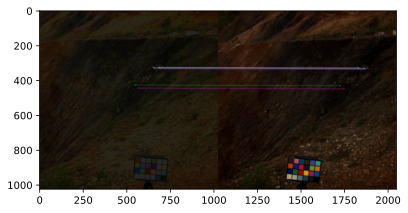

Found 11 good matches between source and destination regions.


In [82]:
st_cliff.findWarp(show=True)

Even selecting a small subset of the image has successfully found 570 tie-points to use when solving for the homography matrix, that warps the LWAC view to the RWAC.

In [83]:
tag = 'cliff'

We're going to prepare another all-filter MSC as the destination.

In [84]:
lrwac_msc_loader = aupy.AupeIO('LRWAC', 'MSC', sol, scene)
lrwac_msc_cliff = lrwac_msc_loader.load_frame()

Now we will apply the warp that we learned above to the full MSCs for the LWAC, warping it to the RWAC.

In [85]:
st_cliff.applyWarp(lwac_msc, rwac_msc, lrwac_msc_cliff, tag)

To illustrate this, we will produce a NIR, Red, Blue browse product image, using the G11, G05 and G01 narrowband filters.

In [86]:
lrwac_msc_cliff.set_false_color({'R': 'G11', 'G': 'G05', 'B': 'G01'})

Stretching image using 99th percentile balanced


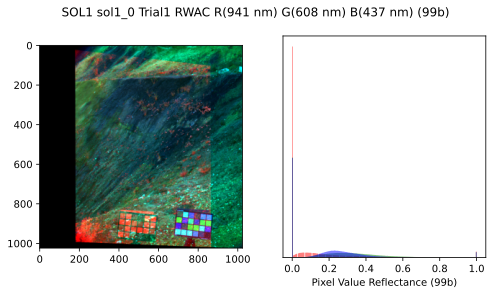

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (99b)'>], dtype=object))

In [87]:
lrwac_msc_cliff.false_rgb.show_image('99b')

Now we can see that the calibration target moves between the scenes, as it is in the foreground compared to the cliff face we have rectified for.

Stretching image using 99th percentile balanced
Target Width: 183 Height: 121, Samples: 225


/Users/sci/.local/lib/python3.13/site-packages/colour/utilities/verbose.py:322: ColourUsageWarning: Cannot compute the colour checker orientation because the reference values are not available! Please update "Colour" to a version greater-than 0.4.4.
  warn(*args, **kwargs)  # noqa: B028


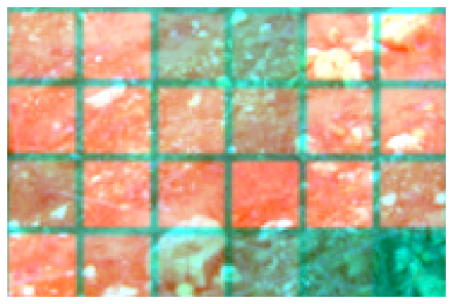

In [88]:
rwac_cal_targ.show_target(lrwac_msc_cliff.false_rgb.get_image('99b'))

Indeed we have a noisy image.

We now export this browse product, along with an ENVI file of the complete scene, and a gif animation of the bands.

We mark with the 'tag' keyword that we have focused our rectification on the calibration target.

In [89]:
lrwac_msc_cliff.false_rgb.export_image('99b')

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/LRWAC/MSC/cliff/RGB/SOL1_sol1_0_Trial1_RWAC_RGB_G11G05G01_99b.png')

In [90]:
lrwac_msc_cliff.export_2_envi()

Reflectance coefficients saved to ../data/../processed/SOL1/sol1_0/Trial1/LRWAC/MSC/cliff/SOL1_sol1_0_Trial1_LRWAC_refl_coeffs.csv


In [91]:
lrwac_msc_cliff.export_2_gif()

Exporting image G01 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G02 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G03 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G04 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G05 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G06 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G07 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G08 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G09 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G10 
Stretching image using raw image no stretch
Applying stretch factor of 1.0
Exporting image G11 
Stretching image us

---

# HRC Processing

We now process the HRC scene.

This involves loading the HRC frame, debayering it, and colour balancing it.

As for the WACs, we take advantage of the fact that the calibration target is in this HRC scene, and use this to approximately calibrated the colour.

We then perform processing where we treat HRC as a multispectral imager, and convert to reflectance units. We can then solve for the colour correction matrix that recovers sRGB colour of the scene.



As most HRC scenes don't include the calibration target, we then explore methods for translating the reflectance correction coefficients and reflectance->sRGB CCM from the WACs to HRC.

Finally, we look into ways of warping an LRWAC rectified cube on to an HRC image, to give spectral information to the HRC image.

## HRC RGB Colour Processing

In [92]:
hrc_loader = aupy.AupeIO('HRC', 'RGB', sol, scene)

In [93]:
hrc = hrc_loader.load_frame()

Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist


Stretching image using 99th percentile balanced


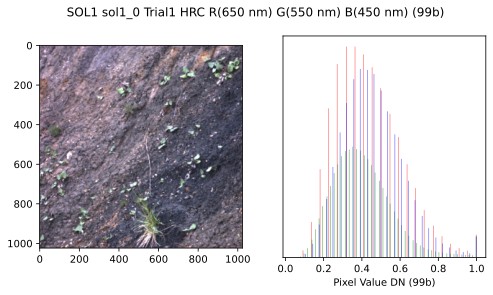

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value DN (99b)'>], dtype=object))

In [94]:
hrc.show_image('99b')

We can also export the colour corrected image.

In [95]:
hrc.export_image('99b')

Exporting image using 99th percentile balanced
Stretching image using 99th percentile balanced


PosixPath('../data/../processed/SOL1/sol1_0/Trial1/HRC/RGB/SOL1_sol1_0_Trial1_HRC_RGB_H1RH2GH3B_99b.png')

We note that this colour correction isn't perfect, because it assumes that the scene illumination matches the illumination used for the Colour Checker patch expected values.

One way to correct for this would be to fit an illuminant parameterised by correlated colour temperature.

Alternatively, we can solve for the illuminant via the reflectance calibration stage.

## HRC Reflectance Processing

Now we load the HRC image and treat it as a multispectral cube, finding the reflectance corrections for the calibration target that is in the scene.

In [96]:
hrc_loader = aupy.AupeIO('HRC', 'MSC', sol, scene)

In [97]:
hrc_msc = hrc_loader.load_frame()


Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
Filter response file data/response_files/HRC/HR0.csv does not exist
HRC frame debayered and converted to MSC


We choose to correct for exposure, so that the relationship between the image units and the reflectance is dependent on the instrument and the scene illumination only, and not the exposure time used.

(<Figure size 800x400 with 1 Axes>,
 <Axes: title={'center': 'SOL1 sol1_0 Trial1 HRC'}, xlabel='Wavelength (nm)', ylabel='Exposure Time (s)'>)

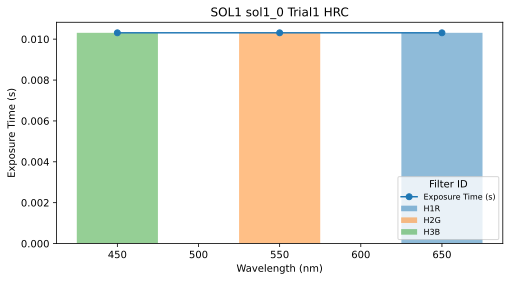

In [98]:
hrc_msc.exposure_correct()
hrc_msc.plot_exposures()

We can check first that the scene has been loaded and debayered correctly.

Stretching image using 99th percentile balanced


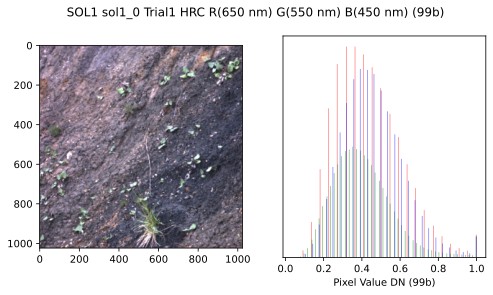

In [99]:
fig, ax = hrc_msc.false_rgb.show_image('99b')

## Finding the HRC deRGB -> Reflectance via RWAC RGB Reflectance Correction

Now we need to test if we can achieve HRC reflectance calibration by applying $M_R$ and $M_O$ to the RWAC RGB reflectance and offset coefficients, and then assign the new reflectance coeffs and offsets to the HRC exposure corrected scene, to give a reflectance corrected image.

We won't always have the calibration target in the HRC frame, but we will in almost all RWAC frames.

After exposure correction, the difference in response between the RWAC RGB filters and the HRC RGB channels should be constant, such that there should exist an instrument-dependent, or intrinsic, transform that maps the RWAC RGB reflectance coefficients to the HRC reflectance coefficients.

This may be a matrix transform, to account for overlaps of the R,G,B transmission profiles, that exist for HRC but not so much for the WACs.

Here, we find the RWAC -> HRC reflectance transform, by finding the matrix:

$R_\text{HRC} = M_R R_\text{RWAC}$

and the offsets:

$O_\text{HRC} = M_O O_\text{RWAC}$

In [101]:
hrc_msc.load_reflectance_coefficients_from_transfer(rwac_rgb_msc)

In [102]:
hrc_msc.apply_reflectance_calibration()

We can check that the reflectance and CCM have been applied correctly by viewing the CCM image. Note that this CCM should be applicable to all of the LWAC RGB, RWAC RGB and HRC RGB frames, when they have been calibrated to reflectance.

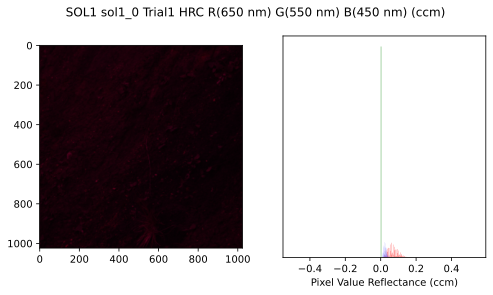

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (ccm)'>], dtype=object))

In [103]:
hrc_msc.false_rgb.show_image('ccm')

Indeed, we have achieved proper colour calibration.

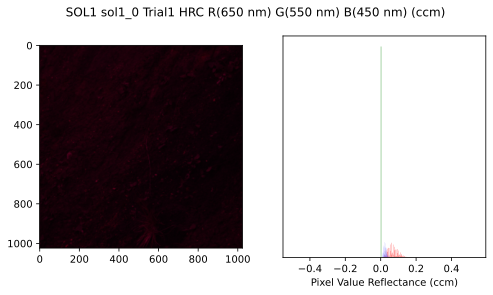

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: >, <Axes: xlabel='Pixel Value Reflectance (ccm)'>], dtype=object))

In [104]:
hrc_msc.false_rgb.show_image('ccm')

## Warping the LRWAC Frame to the HRC Frame

Now we will boldly try to warp the complete 12-band cube to the HRC view. This will allow a user to load a multispectral view under the HRC ENVI image, to give approximate spectra for each point in the HRC frame.

We set up a stereo tool to find the warp from the RWAC view to the HRC view.

In [ ]:
st_hrc = aupy.StereoTools(rwac_rgb_msc.false_rgb.get_image('ccm'), hrc_msc.false_rgb.get_image('ccm'))

We select the calibration target as our object to optimise the rectification for.

In [ ]:
st_hrc.select_match_regions()

In [ ]:
st_hrc.findWarp(show=True)

We can see that the algorithm has struggled a little with the difference in scales, finding only 18 matches over the target, which notably is less than the number of target patches.

In [ ]:
tag = 'caltarg'

We prepare an all-filter MSC to use as the warp destination.

In [ ]:
lrwhrc_msc_loader = aupy.AupeIO('LRWHRC', 'MSC', sol, scene)
lrwhrc_msc = lrwhrc_msc_loader.load_frame()

Now we will apply the warp that we learned above to the full MSC from the RWAC view, warping it to HRC.

In [ ]:
rwac_rgb_msc.false_rgb.show_image('ccm')

In [ ]:
lrwac_msc.false_rgb.show_image('99b')

In [ ]:
st_hrc.applyWarp(lrwac_msc, hrc_msc, lrwhrc_msc, tag)

To illustrate this, we will produce a NIR, Red, Blue browse product image, using the G11, G05 and G01 narrowband filters.

In [ ]:
lrwhrc_msc.set_false_color({'R': 'G11', 'G': 'G05', 'B': 'G01'})

Now we can check the image result.

In [ ]:
lrwhrc_msc.false_rgb.show_image('99b')

Indeed, we find that we now have a false colour NIR, Green, Blue image that matches the HRC view.

Let's check that the calibration target outline is still valid for this image.

In [ ]:
hrc_cal_targ.show_target_outline(lrwhrc_msc.false_rgb.get_image('99b'))

Yes, it has been preserved.

In [ ]:
lrwhrc_msc.export_2_envi()
lrwhrc_msc.export_2_gif()
lrwhrc_msc.false_rgb.export_image('99b')